In [1]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Bruna Luiza Bispo
# NUSP : 11488516
# Turma: MAC5768 - Visão e Processamento de Imagens (2024)
# Prof.: Ronaldo Fumio Hashimoto
##################################################################

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from cv2 import imwrite

In [9]:
def equalizar_histograma(imagem_cinza):
    #imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    hist, bins = np.histogram(imagem_cinza.flatten(), bins=256, range=[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * (hist.max() / cdf.max())

    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')

    img_equalizada = cdf[imagem_cinza]
    
    return img_equalizada

In [10]:
#Deve-se usar a equalização de histograma como função inicial de normalização, gerando um normalizedDataset
for nome_pasta in os.listdir():
    if 'augmenteddataset' in nome_pasta.lower():
        caminho_normalizado = 'normalizedDataset' + nome_pasta.lower().replace('augmenteddataset', '')
        if not os.path.isdir(caminho_normalizado):
            os.mkdir(caminho_normalizado)
        for arquivo in os.listdir(nome_pasta):
            if ".jpeg" in arquivo:
                imagem = plt.imread(os.path.join(nome_pasta, arquivo))
                imagem_equalizada = equalizar_histograma(imagem)
                imwrite(os.path.join(caminho_normalizado, arquivo), imagem_equalizada)

In [5]:
#Histograma médio de cada uma das iluminações para o originalGrayDataset

meta_dados = pd.read_csv('meta_dados.csv')

lista_iluminacao = meta_dados['iluminacao'].drop_duplicates().tolist()
lista_iluminacao = list(set(lista_iluminacao))

lista_histograma_medio = []

for iluminacao in lista_iluminacao:
    df_iluminacao = meta_dados[meta_dados['iluminacao']==iluminacao]
    lista_imagens = df_iluminacao['nome_arquivo'].drop_duplicates().tolist()
    qtdd_imagem = len(lista_imagens)
    histograma_medio = np.zeros(256)
    for nome_imagem in lista_imagens:
        imagem = plt.imread(os.path.join('originalGrayDataset', nome_imagem))
        hist, _ = np.histogram(imagem.flatten(), bins=256, range=[0, 256])
        histograma_medio += hist
    histograma_medio /= qtdd_imagem
    lista_histograma_medio.append([iluminacao, histograma_medio])

In [6]:
#Histograma médio de cada processamento diferente dentro do augmentedDataSet (exp, log, etc)

for nome_pasta in os.listdir():
    if 'augmenteddataset' in nome_pasta.lower():
        qtdd_imagem = len(os.listdir(nome_pasta))
        histograma_medio = np.zeros(256)
        for arquivo in os.listdir(nome_pasta):
            if ".jpeg" in arquivo:
                imagem = plt.imread(os.path.join(nome_pasta, arquivo))
                hist, _ = np.histogram(imagem.flatten(), bins=256, range=[0, 256])
                histograma_medio += hist
        histograma_medio /= qtdd_imagem
        lista_histograma_medio.append([nome_pasta, histograma_medio])

In [7]:
#Histograma médio de cada processamento diferente dentro histograma após a normalização

for nome_pasta in os.listdir():
    if 'normalizeddataset' in nome_pasta.lower():
        qtdd_imagem = len(os.listdir(nome_pasta))
        histograma_medio = np.zeros(256)
        for arquivo in os.listdir(nome_pasta):
            if ".jpeg" in arquivo:
                imagem = plt.imread(os.path.join(nome_pasta, arquivo))
                hist, _ = np.histogram(imagem.flatten(), bins=256, range=[0, 256])
                histograma_medio += hist
        histograma_medio /= qtdd_imagem
        lista_histograma_medio.append([nome_pasta, histograma_medio])


In [11]:
#Função EP1

###Ajuste das imagem em tabela sumária para ficar em apenas uma imagem

#Criar um jupyter notebook com uma biblioteca de funções para ler a base e visualizá-la
#de uma forma de tabela sumária de dados. Por exemplo, para visualizar a base de
#dados como um todo,

meta_dados = pd.read_csv('meta_dados.csv')

lista_objetos = meta_dados['1_classe'].drop_duplicates().tolist() + meta_dados['2_classe'].drop_duplicates().tolist() + meta_dados['3_classe'].drop_duplicates().tolist() + meta_dados['4_classe'].drop_duplicates().tolist() + meta_dados['5_classe'].drop_duplicates().tolist()
lista_objetos = list(set(lista_objetos))

def juntar_imagem(meta_dados, lista_objetos, caminho):
    lista_linhas = []
    
    for objeto in lista_objetos:
    
        df_objeto = meta_dados[(meta_dados['1_classe'] == objeto) | (meta_dados['2_classe'] == objeto) | (meta_dados['3_classe'] == objeto) | (meta_dados['4_classe'] == objeto) | (meta_dados['5_classe'] == objeto)]
        lista_imagens_objeto = list(df_objeto['nome_arquivo'])
    
        imagens = []
        for arquivo in lista_imagens_objeto:
            if ".jpeg" in arquivo:
                imagem = plt.imread(os.path.join(caminho, arquivo))
                imagens.append(imagem)
                
        max_height = max(imagem.shape[0] for imagem in imagens)
        total_width = sum(imagem.shape[1] for imagem in imagens)
        linha_combinada = np.zeros((max_height, total_width), dtype=np.uint8)
        
        x_offset = 0
        for imagem in imagens:
            height, width, = imagem.shape
            linha_combinada[:height, x_offset:x_offset+width] = imagem
            x_offset += width
        lista_linhas.append(linha_combinada)
    
    max_width = max(linha.shape[1] for linha in lista_linhas)
    total_height = sum(linha.shape[0] for linha in lista_linhas)
    imagem_final = np.zeros((total_height, max_width), dtype=np.uint8)
    
    y_offset = 0
    for linha in lista_linhas:
        height, width = linha.shape
        imagem_final[y_offset:y_offset+height, :width] = linha
        y_offset += height

    return imagem_final

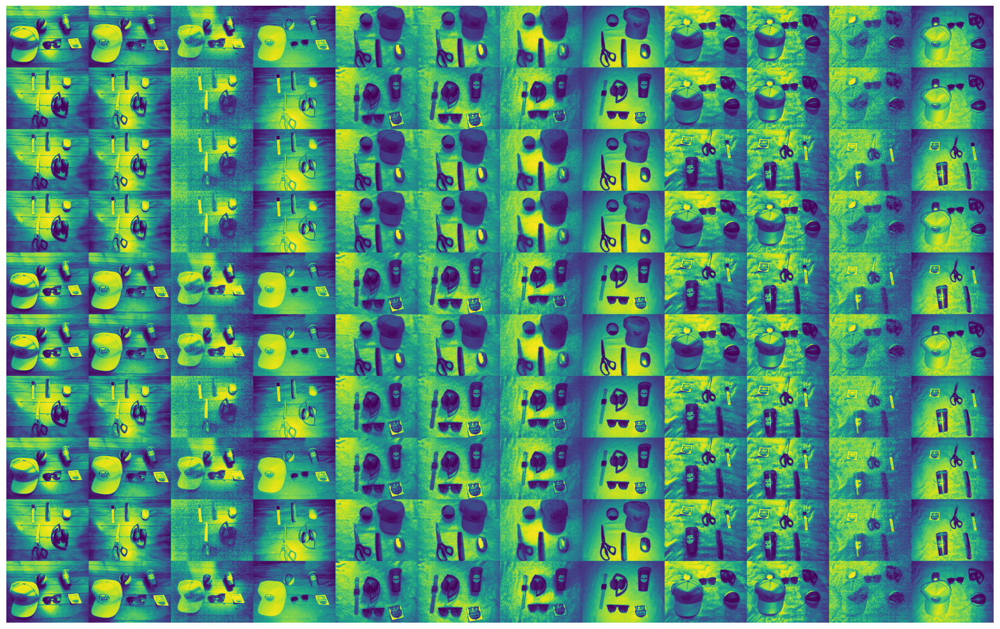

In [12]:
#Contrast Stretching

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'normalizedDataset_stretching')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

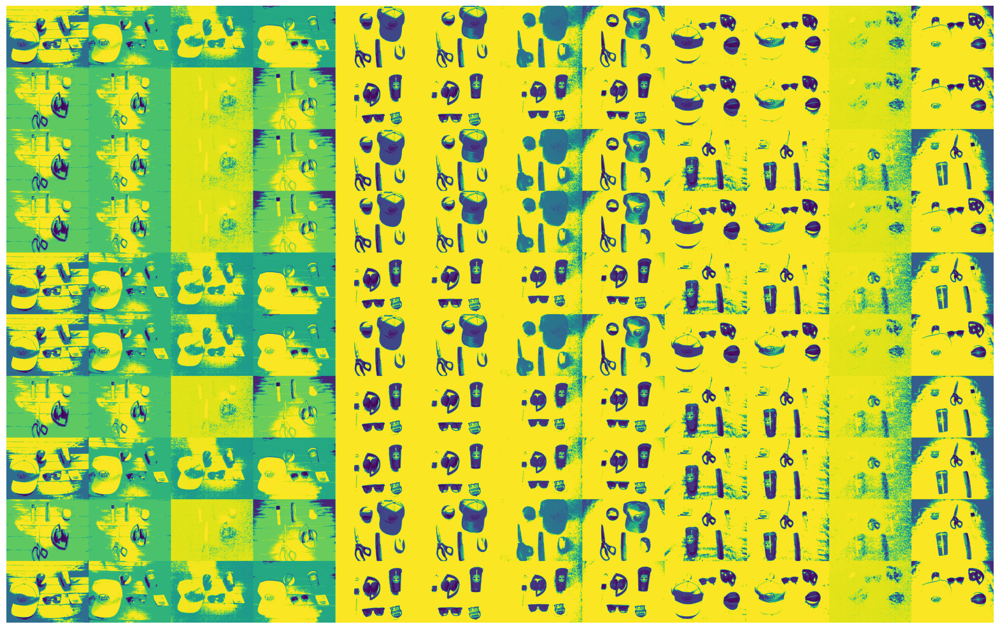

In [13]:
#Logaritmo

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'normalizedDataset_log')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

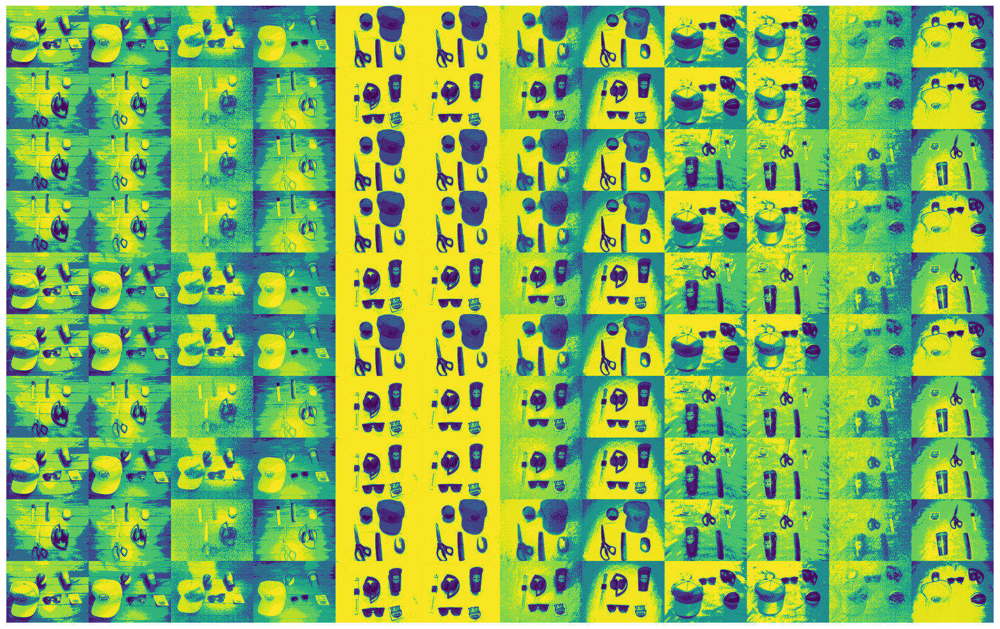

In [14]:
#Exponencial

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'normalizedDataset_expo')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

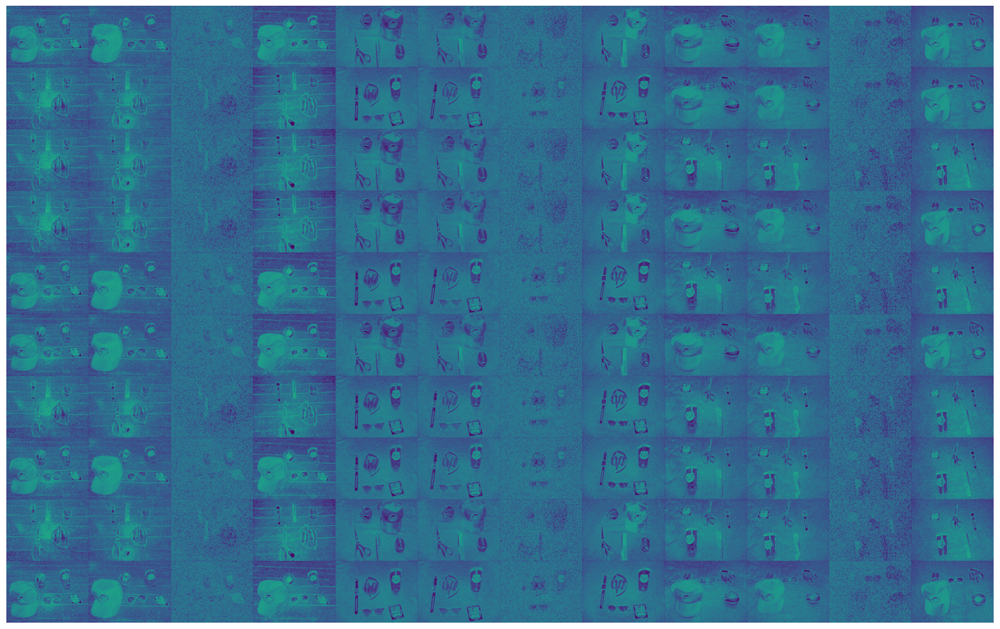

In [15]:
#Laplaciano 

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'normalizedDataset_laplaciano')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

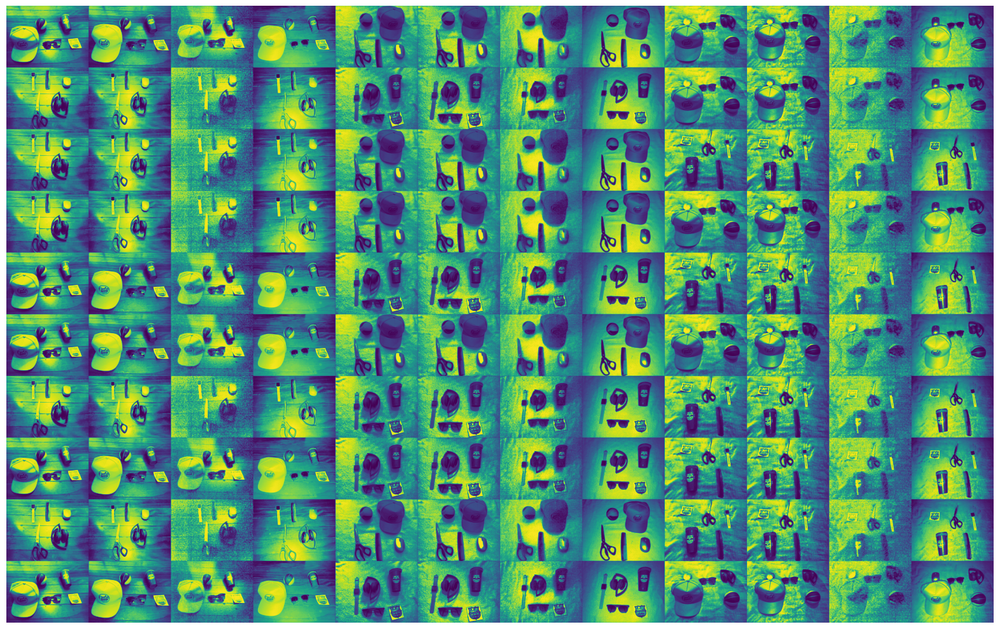

In [16]:
#Filtro da média 

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'normalizedDataset_media')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()